<a href="https://colab.research.google.com/github/masterinfo/COURS_ELEARNING/blob/master/Cats_vs_Dogs_VGG_16_kaggle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**author Wilfrid MORELL**


Cats vs Dogs-VGG_16  kaggle  modified from 

https://www.kaggle.com/code/saritrath/cats-vs-dogs-vgg-16

tutoriel python3 CNN Fine tining VGG16 dogs vs cats 
 



Import  libraries....

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import random
import zipfile
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, classification_report 
import tensorflow as tf
from keras.preprocessing.image import load_img, ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, GlobalAveragePooling2D, Dropout, BatchNormalization, Input
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.applications.vgg16 import VGG16, preprocess_input

batch_size = 128

PYTHONHASHSEED. The hashes of the str, bytes, and datetime objects are seeded with a random value if this variable is not set or if it is set to the random value value. It is used as a fixed seed for generating hash() of the types covered by the hash randomization when the integer value of PYTHONHASHSEED is set to a positive integer value

The seed() method is used to initialize the random number generator.

The random number generator needs a number to start with (a seed value), to be able to generate a random number.

By default the random number generator uses the current system time.


In [2]:
seed = 666
tf.random.set_seed(seed)
np.random.seed(seed)
os.environ["PYTHONHASHSEED"] = str(seed)                      
random.seed(666)

Connect to google drive train directory and create a dataframe from files and labels ( names of the differents directories )

In [4]:
rep_training='/content/drive/My Drive/dogs-vs-cats/train/'
train_df = pd.DataFrame({"file": os.listdir( rep_training)})
train_df["label"] = train_df["file"].apply(lambda x: x.split(".")[0])

train_df.head()


,file,label
0,cat.9065.jpg,cat
1,cat.9103.jpg,cat
2,cat.9100.jpg,cat
3,cat.9111.jpg,cat
4,cat.907.jpg,cat


Connect to google drive test directory and create a dataframe from files and labels just one directory called "test" )

In [5]:
rep_test='/content/drive/My Drive/dogs-vs-cats/testdata/test/'
test_df = pd.DataFrame({"file": os.listdir(rep_test)})

test_df.head()


,file
0,11535.jpg
1,11565.jpg
2,11523.jpg
3,11508.jpg
4,11542.jpg


Disttribution of images inside the 2 directories 'cat' and 'dog' from datataframe train_df ( which come from Train directory :parent of the 2 directories 'cat' and 'dog' )

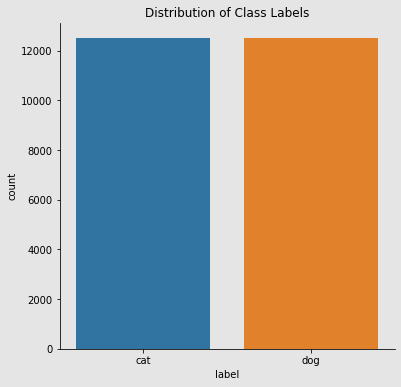

In [6]:
fig, ax = plt.subplots(figsize = (6, 6), facecolor = "#e5e5e5")
ax.set_facecolor("#e5e5e5")

sns.countplot(x = "label", data = train_df, ax = ax)

ax.set_title("Distribution of Class Labels")
sns.despine()
plt.show()

Display the 25 firsts images from train_df

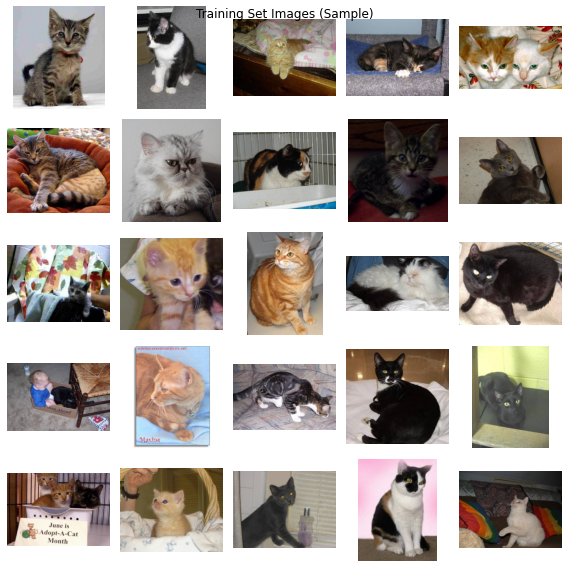

In [7]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Training Set Images (Sample)")

for i in range(25):

    plt.subplot(5, 5, i + 1)
    image = load_img( "/content/drive/My Drive/dogs-vs-cats/train/" + train_df["file"][i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

Display the 25 firsts images of dogs , from train_df

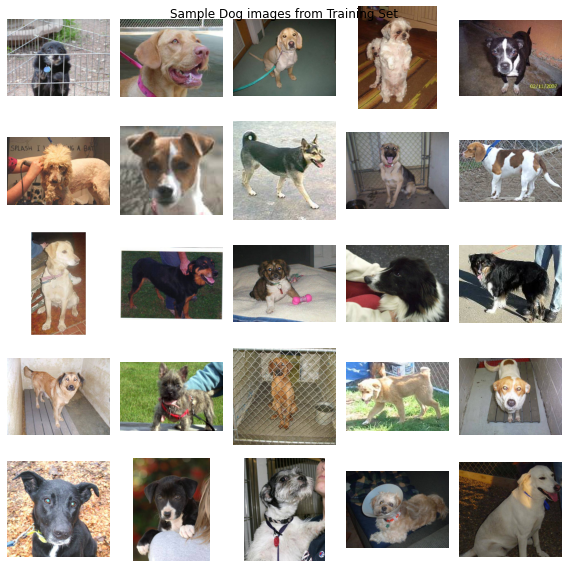

In [8]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Sample Dog images from Training Set")

for i in range(25):
    
    plt.subplot(5, 5, i + 1)
    image = load_img( "/content/drive/My Drive/dogs-vs-cats/train/" + train_df.query("label == 'dog'").file.values[i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

Display the 25 firsts images of cats , from train_df

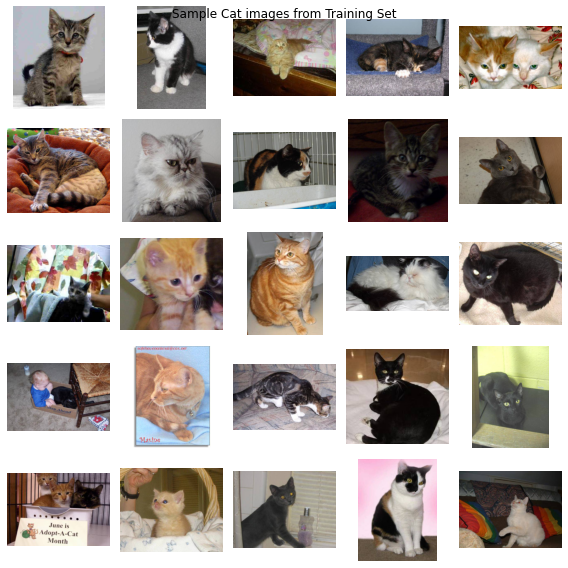

In [9]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Sample Cat images from Training Set")

for i in range(25):
    
    plt.subplot(5, 5, i + 1)
    image = load_img("/content/drive/My Drive/dogs-vs-cats/train/"+ train_df.query("label == 'cat'").file.values[i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

split datas from train dirctory in 2 parts : training datas and validation datas  (resp. 80% and 20%)

As such, it is desirable to split the dataset into train and test sets in a way that preserves the same proportions of examples in each class as observed in the original dataset. This is called a stratified train-test split

In [10]:
train_data, val_data = train_test_split(train_df, 
                                        test_size = 0.2, 
                                        stratify = train_df["label"], 
                                        random_state = 666)

the 10 firsts items for training

In [11]:
train_data[:10]

,file,label
15705,dog.7475.jpg,dog
11330,cat.10744.jpg,cat
2864,cat.8030.jpg,cat
20972,dog.3186.jpg,dog
8623,cat.2464.jpg,cat
16569,dog.6488.jpg,dog
13150,dog.8751.jpg,dog
23347,dog.11208.jpg,dog
12229,dog.9751.jpg,dog
5244,cat.4830.jpg,cat


the 10 firsts items forvalidation

In [12]:
val_data[:10]

,file,label
10307,cat.11614.jpg,cat
8388,cat.2191.jpg,cat
16081,dog.6002.jpg,dog
13661,dog.9211.jpg,dog
8916,cat.2760.jpg,cat
15097,dog.6918.jpg,dog
121,cat.9211.jpg,cat
16120,dog.6069.jpg,dog
11948,cat.11299.jpg,cat
359,cat.9422.jpg,cat


 choose 1 item randomly from trainng datas

In [13]:
sample_df = train_data.sample(1)
print(sample_df)

                file label
23707  dog.11549.jpg   dog


Create a generator for image augmentation 

Keras ImageDataGenerator is used for getting the input of the original data and further, it makes the transformation of this data on a random basis and gives the output resultant containing only the data that is newly transformed. It does not add the data

In [14]:
datagen = ImageDataGenerator(
    rotation_range = 30, 
    width_shift_range = 0.1,
    height_shift_range = 0.1, 
    brightness_range = (0.5, 1), 
    zoom_range = 0.2,
    horizontal_flip = True, 
    rescale = 1./255,
    # shuffle=True,
)

The flow_from_dataframe() method takes the Pandas DataFrame and the path to a directory and generates batches of augmented/normalized data

Base on the image sample 

Class modes:

    "categorical": 2D output (aka. list of numbers of length N), [0, 0, 1, 0], which is a one-hot encoding (only one number is 1/ "hot") representing the donkey. This is for mutually exclusive labels. A dog cannot be a cat, a human is not a dog.
    "binary": 1D output (aka. 1 number), which is either 0, 1, 2, 3 ... N. It is called this because it is binary if there are only two classes (IMHO this is a bad reason), source. I suggest using "binary" just for single label classification, because it documents-in-code, your intention.
    "sparse": After digging in the code, this is the same as "binary". The logic is done with elif self.class_mode in {'binary', 'sparse'}:, and the class_mode is not used after that. I suggest using "sparse" for multilabel classification though, again because it documents-in-code, your intention.
    "input": The label is literally the image again. So the label for an image of the dog, is the same dog picture array. If I knew more about autoencoders I might have been able to explain further.
    None: No labels, therefore not useful for training, but for inference/ prediction

In [15]:
sample_generator = datagen.flow_from_dataframe(
    dataframe = sample_df,
    directory = "/content/drive/My Drive/dogs-vs-cats/train/",
    x_col = "file",
    y_col = "label",
    class_mode = "categorical",
    target_size = (224, 224),
    seed = 666
)

Found 1 validated image filenames belonging to 1 classes.


Display   images of the sample image with augmentation

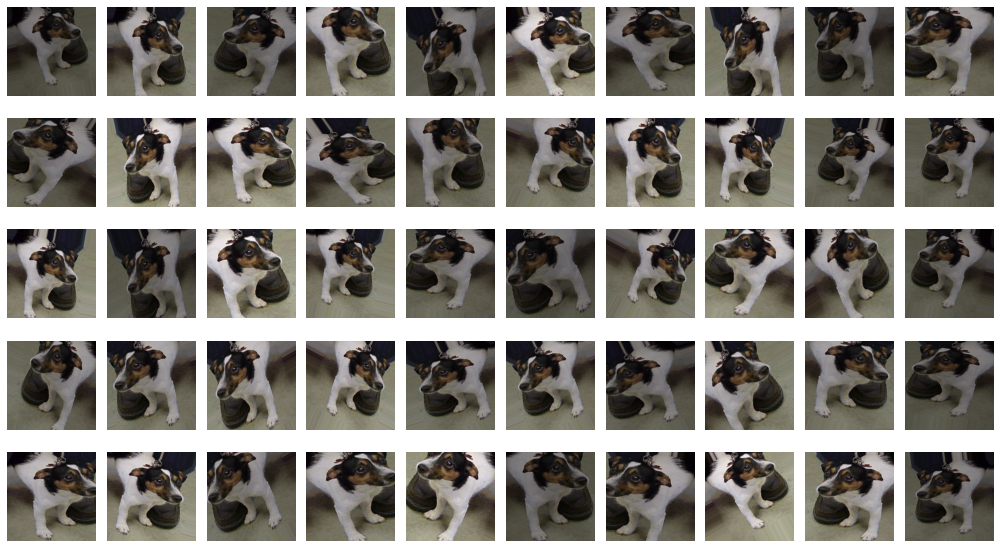

In [16]:

plt.figure(figsize = (14, 8))

for i in range(50):
    
    plt.subplot(5, 10, i + 1)
    
    for X, y in sample_generator:
        # print(X)
        # print(y)
        plt.imshow(X[0])
        plt.axis("off")
        break
        
plt.tight_layout()
plt.show()



---



---



---



Create a new Imagedatagenerator for further training datas and validation datas

In [17]:
train_datagen = ImageDataGenerator(
    rotation_range = 15, 
    width_shift_range = 0.1,
    height_shift_range = 0.1, 
    brightness_range = (0.5, 1), 
    zoom_range = 0.1,
    horizontal_flip = True,
    preprocessing_function = preprocess_input
)

val_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)



Create  generator from dataframe for training datas and validation datas

In [18]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = "/content/drive/My Drive/dogs-vs-cats/train/",
    x_col = "file",
    y_col = "label",
    class_mode = "categorical",
    target_size = (224, 224),
    batch_size = batch_size,
    seed = 666,
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe = val_data,
    directory = "/content/drive/My Drive/dogs-vs-cats/train/",
    x_col = "file",
    y_col = "label",
    class_mode = "categorical",
    target_size = (224, 224),
    batch_size = batch_size,
    seed = 666,
    shuffle = False
)

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.




---



---



---



**************Load an existing model 

In [19]:
from keras.saving.save import load_model
input_shape=(224,224,3)
batch_size= 128
model=load_model("/content/drive/My Drive/dogs-vs-cats/model_best_dogs_vgg16.h5")

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 100)               51300     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                6464      
                                                                 
 dense_2 (Dense)             (None, 2)                 130       
                                                        



---



---



---



********** or create one from scratch = fine tuning with vgg16 base



---



---



---



In [20]:
from keras.applications.vgg16 import VGG16
from keras.models import Model


input_shape=(224,224,3)
batch_size= 128

base_model = VGG16(
    weights = "imagenet", 
    input_shape = (224, 224, 3),
    include_top = False
)

for layer in base_model.layers:
    layer.trainable = False
    
def vgg16_pretrained():
    
    model= Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(100,activation='relu'),
        Dropout(0.4),
        Dense(64,activation='relu'),
        Dense(2,activation='softmax')
    ])
    
    return model


tf.keras.backend.clear_session()

58900480/58889256 [==============================] - 0s 0us/step


In [21]:
model = vgg16_pretrained()

model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = "accuracy")





In [ ]:
model.summary()

What is Clear_session?
What is tf. clear_session? Why is it required? This function is used to reset all the states which have been generated by keras. Keras managing or manages all the global states in which for implementation of the functional model building API and to uniquify the autogenerated layer names is being used by kera

Reduce learning rate when a metric has stopped improving. Models often benefit from reducing the learning rate by a factor of 2-10 once learning stagnates

EarlyStopping class

Stop training when a monitored metric has stopped improving. Assuming the goal of a training is to minimize the loss. With this, the metric to be monitored would be 'loss' , and mode would be 'min'

The ModelCheckpoint callback class allows you to define where to checkpoint the model weights, how to name the file, and under what circumstances to make a checkpoint of the model. The API allows you to specify which metric to monitor, such as loss or accuracy on the training or validation dataset

In [21]:
from keras.callbacks import ReduceLROnPlateau 
from keras.callbacks import ModelCheckpoint, EarlyStopping
reduce_lr = ReduceLROnPlateau(
    monitor = "val_accuracy", 
    patience = 2,
    verbose = 1, 
    
    factor = 0.5, 
    min_lr = 0.000000001
)

early_stopping = EarlyStopping(
    monitor = "val_accuracy",
    patience = 5,
    verbose = 1,
    mode = "max",
)

checkpoint = ModelCheckpoint(
    monitor = "val_accuracy",
    filepath = "catdog_vgg16_.{epoch:02d}-{val_accuracy:.6f}.hdf5",
    verbose = 1,
    save_best_only = True, 
    save_weights_only = True
)

generate history from model training

In [23]:

history = model.fit(
    train_generator,
    epochs = 20, 
    validation_data = val_generator,
    validation_steps = val_data.shape[0] // batch_size,
    steps_per_epoch = train_data.shape[0] // batch_size,
    callbacks = [reduce_lr,checkpoint],
    # callbacks = [reduce_lr, early_stopping, checkpoint]
)



Epoch 1/20
156/156 [==============================] - 7313s 47s/step - loss: 0.1652 - accuracy: 0.9489 - val_loss: 0.0716 - val_accuracy: 0.9804 - lr: 0.0010
Epoch 2/20
156/156 [==============================] - 284s 2s/step - loss: 0.0752 - accuracy: 0.9725 - val_loss: 0.0759 - val_accuracy: 0.9774 - lr: 0.0010
Epoch 3/20
156/156 [==============================] - 284s 2s/step - loss: 0.0596 - accuracy: 0.9779 - val_loss: 0.0662 - val_accuracy: 0.9814 - lr: 0.0010
Epoch 4/20
156/156 [==============================] - 283s 2s/step - loss: 0.0503 - accuracy: 0.9812 - val_loss: 0.0643 - val_accuracy: 0.9806 - lr: 0.0010
Epoch 5/20
156/156 [==============================] - 283s 2s/step - loss: 0.0472 - accuracy: 0.9822 - val_loss: 0.0595 - val_accuracy: 0.9838 - lr: 0.0010
Epoch 6/20
156/156 [==============================] - 282s 2s/step - loss: 0.0421 - accuracy: 0.9839 - val_loss: 0.0705 - val_accuracy: 0.9798 - lr: 0.0010
Epoch 7/20
156/156 [==============================] - ETA: 0s 

Saved last model with weights which is not necessarily the best ( depends of checkpoints and earlystopping)

In [24]:
model.save('/content/drive/My Drive/dogs-vs-cats/model_best_dogs_vgg16.h5')
print("model saved")

model saved





---


---



---



learning diagramm if training model....

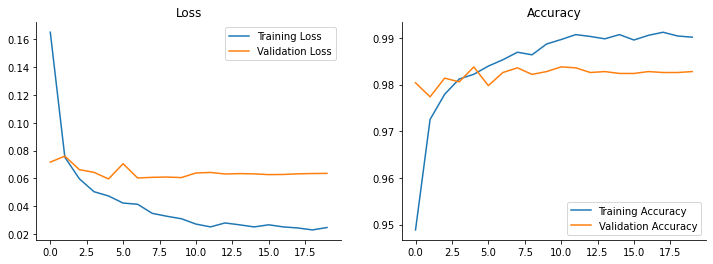

In [26]:
fig, axes = plt.subplots(1, 2, figsize = (12, 4))

sns.lineplot(x = range(len(history.history["loss"])), y = history.history["loss"], ax = axes[0], label = "Training Loss")
sns.lineplot(x = range(len(history.history["loss"])), y = history.history["val_loss"], ax = axes[0], label = "Validation Loss")

sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["accuracy"], ax = axes[1], label = "Training Accuracy")
sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["val_accuracy"], ax = axes[1], label = "Validation Accuracy")
axes[0].set_title("Loss"); axes[1].set_title("Accuracy")

sns.despine()
plt.show()

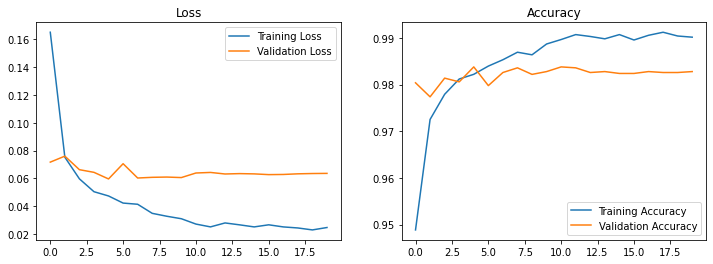

In [27]:
fig, axes = plt.subplots(1, 2, figsize = (12, 4))
 
sns.lineplot(x = range(len(history.history["loss"])), y = history.history["loss"], ax = axes[0], label = "Training Loss")
sns.lineplot(x = range(len(history.history["loss"])), y = history.history["val_loss"], ax = axes[0], label = "Validation Loss")
 
sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["accuracy"], ax = axes[1], label = "Training Accuracy")
sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["val_accuracy"], ax = axes[1], label = "Validation Accuracy")
axes[0].set_title("Loss"); axes[1].set_title("Accuracy")
 
# sns.despine()
plt.show()



---



---



---



Prediction for validation datas with model( loaded or trained)

In [24]:


val_pred = model.predict(val_generator, steps = np.ceil(val_data.shape[0] / batch_size), verbose=True)

#steps : number of step to load all validation datas

val_data.loc[:, "val_pred"] = np.argmax(val_pred, axis = 1)# add column for prediction of validation datas with 0 for cat and 1 for dog


#modify : 0 by "cat" and 1 by "dog" in val_dat  in the last column created "val_pred"

labels = dict((v, k) for k, v in val_generator.class_indices.items())

val_data.loc[:, "val_pred"] = val_data.loc[:, "val_pred"].map(labels)



40/40 [==============================] - 36s 858ms/step


predict with verbose

In [25]:
 val_data[:10]

,file,label,val_pred
10307,cat.11614.jpg,cat,cat
8388,cat.2191.jpg,cat,cat
16081,dog.6002.jpg,dog,dog
13661,dog.9211.jpg,dog,dog
8916,cat.2760.jpg,cat,cat
15097,dog.6918.jpg,dog,dog
121,cat.9211.jpg,cat,cat
16120,dog.6069.jpg,dog,dog
11948,cat.11299.jpg,cat,cat
359,cat.9422.jpg,cat,cat


 batch_size = 128
 

 val_data.shape[0]=5000
 Found 5000 validated image filenames belonging to 2 classes.

 number of step =50000/128 =39



In [26]:
np.ceil(val_data.shape[0] / batch_size)

40.0



---



labels

In [27]:
labels

{0: 'cat', 1: 'dog'}



---



Confusion matrix for validation test

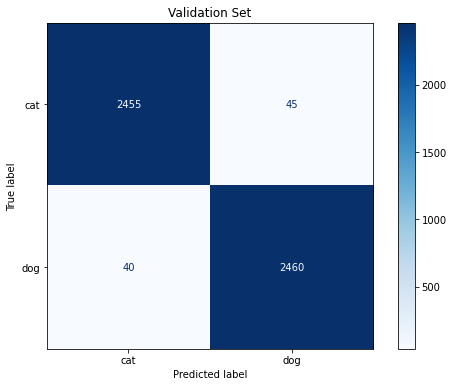

In [28]:
fig, ax = plt.subplots(figsize = (9, 6))

cm = confusion_matrix(val_data["label"], val_data["val_pred"])

disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ["cat", "dog"])
disp.plot(cmap = plt.cm.Blues, ax = ax)

ax.set_title("Validation Set")
plt.show()



---



---



---



save the model in drive

In [ ]:
# model.save('/content/drive/My Drive/dogs-vs-cats/model_best_dogs_vgg16.h5')
# # It can be used to reconstruct the model identically.
# reconstructed_model = keras.models.load_model("my_model")


Loading model from googledrive

In [29]:
 
input_shape=(224,224,3)
batch_size= 128
model=load_model("/content/drive/My Drive/dogs-vs-cats/model_best_dogs_vgg16.h5")



---



---



---



**prediction For test datas **

read the csv file of labels for test datas

In [30]:
import pandas
df = pandas.read_csv("/content/drive/My Drive/dogs-vs-cats/submission.csv")
print(df)


          id  label
0          1      1
1          2      1
2          3      1
3          4      1
4          5      0
...      ...    ...
12495  12496      0
12496  12497      0
12497  12498      1
12498  12499      1
12499  12500      0

[12500 rows x 2 columns]


Example for image =5604.jpg

In [31]:
df.query('id==5604')['label']

5603    1
Name: label, dtype: int64

In [32]:
npdf=np.array(df)
npdf

array([[    1,     1],
       [    2,     1],
       [    3,     1],
       ...,
       [12498,     1],
       [12499,     1],
       [12500,     0]])

Function  returns label from image id

In [33]:
def folab(num):
   val1 = df.query(f'id=={num}')['label'].values[0]
   if val1  == 0:
      return 'cat'
   else:
      return 'dog'


Example for image id =5604

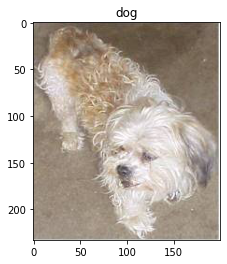

In [34]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/5604.jpg"  )
plt.title(folab(5604))
plt.imshow(image)
 

Example for image id =5603

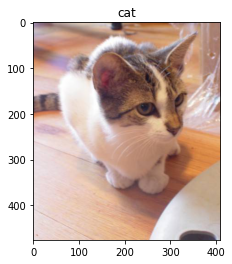

In [35]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/5603.jpg"  )
plt.title(folab(5603))
plt.imshow(image)

Example for image id =613

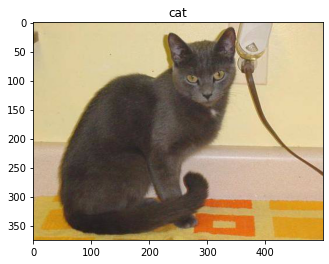

In [36]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/6413.jpg"  )
plt.title(folab(6413))
plt.imshow(image)

Example for image id =1707

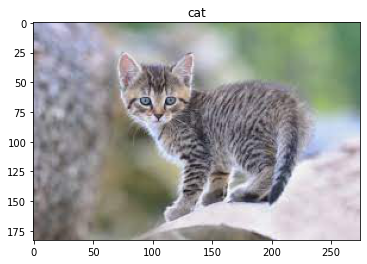

In [37]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1707.jpg"  )
plt.title(folab(1707))
plt.imshow(image)



---



---



---



Datafame from csv file 

In [38]:
test_df

,file
0,11535.jpg
1,11565.jpg
2,11523.jpg
3,11508.jpg
4,11542.jpg
...,...
12495,516.jpg
12496,536.jpg
12497,500.jpg
12498,498.jpg


In [39]:
test_df[:1]['file']

0    11535.jpg
Name: file, dtype: object

Function  returns "label id" from image id

In [40]:
def folabid(num):
   return df.query(f'id=={num}')['label'].values[0] 

Display firsts 64 images from  test datas with labels from csv file 

0 for cat and 1 for dog ( just to check concordance between csv file and image)

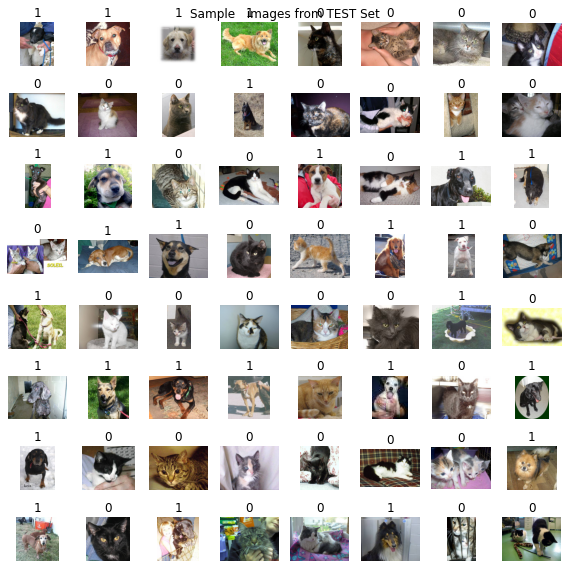

In [41]:
 
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Sample   images from TEST Set")

for i in range(1,65):
    url_im=f"/content/drive/My Drive/dogs-vs-cats/testdata/test/{i}.jpg"
    plt.subplot(8, 8, i )
    image = load_img(url_im )
    plt.imshow(image)
    plt.axis("off")
    plt.title(folabid(i))
    
plt.tight_layout()
plt.show()

Display  64 images from test datas with labels from csv file

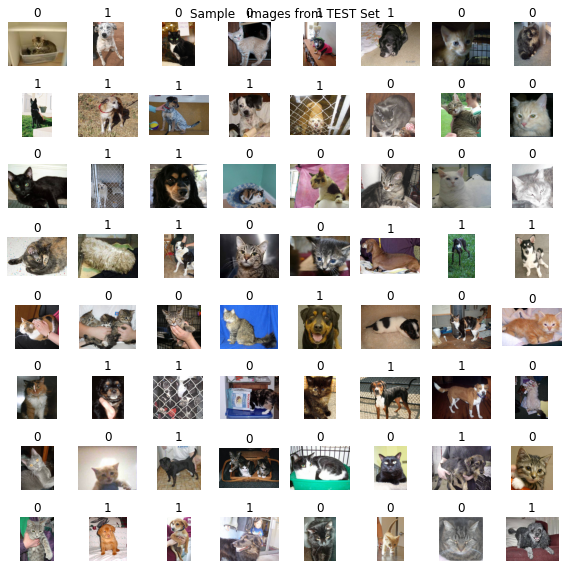

In [42]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Sample   images from TEST Set")

for i in range(1,65):
    url_im=f"/content/drive/My Drive/dogs-vs-cats/testdata/test/{100+i}.jpg"
    plt.subplot(8, 8, i )
    image = load_img(url_im )
    plt.imshow(image)
    plt.axis("off")
    plt.title(folabid(100+i))
    
plt.tight_layout()
plt.show()

Display firsts 64 images from test datas with labels from csv file and prediction of model

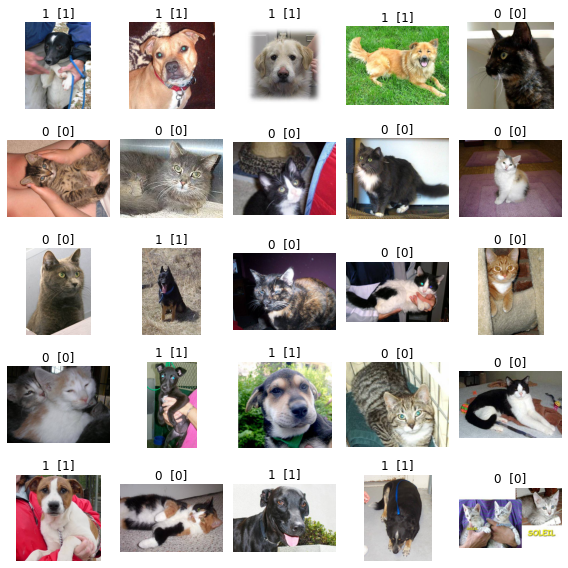

In [43]:
from keras.applications.vgg16 import VGG16, preprocess_input  
fig = plt.figure(1, figsize = (8, 8))
# fig.suptitle("Sample   images from TEST Set")

for i in range(1,26):
    url_im=f"/content/drive/My Drive/dogs-vs-cats/testdata/test/{i}.jpg"
    plt.subplot(5, 5, i )
    imagea = load_img(url_im )
    image = load_img( url_im , target_size=(224,224))
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    prediction = model.predict(image)
    # print(prediction)
    labelid = np.argmax(prediction, axis=1)
    plt.imshow(imagea)
    plt.axis("off")
    plt.title(str(folabid(i)) +"  " +str(labelid))
    
plt.tight_layout()
plt.show()



---



---



Prediction from data generator



---



---



Create a new Imagedatagenerator for further test datas

In [44]:
test_datagen= ImageDataGenerator(preprocessing_function = preprocess_input)

If you are using Transfer Learning where you are not retraining the entire network but replacing the last layer with a few fully connected dense layers, then it is strongly recommended to use the preprocess

The preprocess_input function is meant to adequate your image to the format the model requires.

Some models use images with values ranging from 0 to 1. Others from -1 to +1. Others use the "caffe" style, that is not normalized, but is centered

you need to always use preprocess_input when using pre trained models, and use rescale when training from scratch

In [45]:
test_data = ImageDataGenerator(
    # rescale=1./255,
    preprocessing_function = preprocess_input
)

Images to test 

In [46]:
testdata = test_data.flow_from_directory(directory="/content/drive/My Drive/dogs-vs-cats/testdata/",
     target_size=(224,224),shuffle=False, batch_size=1 )

Found 12500 images belonging to 1 classes.


First batch of image from testdata

In [ ]:
testdata[0]

Number of images to test

In [49]:
len(testdata)

12500

In [48]:
testdata.filenames[0]

'test/1.jpg'

In [50]:
testdata.filenames[:10]

['test/1.jpg',
 'test/10.jpg',
 'test/100.jpg',
 'test/1000.jpg',
 'test/10000.jpg',
 'test/10001.jpg',
 'test/10002.jpg',
 'test/10003.jpg',
 'test/10004.jpg',
 'test/10005.jpg']

Prediction of data images from datatest

In [51]:
predictions = model.predict(testdata, verbose=1)
print(predictions)

12500/12500 [==============================] - 279s 22ms/step
[[3.7346970e-12 1.0000000e+00]
 [1.0000000e+00 8.8006477e-12]
 [9.9999809e-01 1.9388535e-06]
 ...
 [3.3694589e-15 1.0000000e+00]
 [1.0000000e+00 1.3576853e-17]
 [9.9995852e-01 4.1531934e-05]]


convert prediction to label id

In [52]:
labelpred = np.argmax(predictions, axis=1)

labelpred

array([1, 0, 0, ..., 1, 0, 0])

Function which return the label id of an image using the n image num in csv file

In [53]:
def folabid(num):
   return df.query(f'id=={num}')['label'].values[0]

In [54]:
len(testdata.filenames)

12500

In [55]:
"test/1705 (1).jpg" in testdata.filenames 

False

detection of () and counting of labels thanks to a csv file because we use the datagenerator for images ( in google drive some file may be duplicated )

Creation of the id prediction list of images from testdats

In [56]:
nb_bizzare=0
tablo_file_bizarre=[]
tablo_label_id_fril_tesdata=[]
for im in range(len(testdata.filenames)):
    imagefile_name= testdata.filenames[im]
    # print(imagefile_name)
    var1 = imagefile_name.split("/")[-1].split(".")[0]
    numim=var1.split("\\")[-1]
    # print(numim)
    if "(" in numim: 
      nb_bizzare+=1
      numim=var1.split("(")[0]
      tablo_file_bizarre.append(imagefile_name)
    val1=folabid(numim)
    # print(val1)
    tablo_label_id_fril_tesdata.append(int(val1))
    # print("******")

check duplicated files with ()  (ex: 456(1).jpg

In [57]:
tablo_file_bizarre

[]

In [58]:
nb_bizzare

0

list of predict label id from csv file

In [ ]:
,tablo_label_id_fril_tesdata


Prediction list ( id : 0 for cat or 1 for dog)

In [117]:
labelpred

array([1, 0, 0, ..., 1, 0, 0])

number of prediction

In [60]:
len(labelpred)

12500

number of label id  ( should be = to numer of image )

In [61]:
len(tablo_label_id_fril_tesdata)

12500

Confusion matrix of prediction for test images

[[6198   42]
 [  38 6222]]


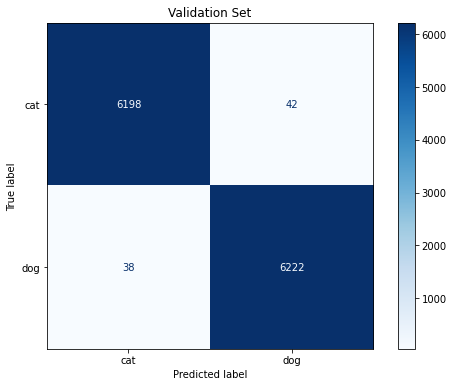

In [62]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm  = confusion_matrix(tablo_label_id_fril_tesdata, labelpred)
print(cm)
fig, ax = plt.subplots(figsize = (9, 6))
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ["cat", "dog"])
disp.plot(cmap = plt.cm.Blues, ax = ax)
ax.set_title("Validation Set")
plt.show()

Classification report 

In [63]:
from sklearn.metrics import classification_report
 
print(classification_report(tablo_label_id_fril_tesdata, labelpred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      6240
           1       0.99      0.99      0.99      6260

    accuracy                           0.99     12500
   macro avg       0.99      0.99      0.99     12500
weighted avg       0.99      0.99      0.99     12500



recall precision..

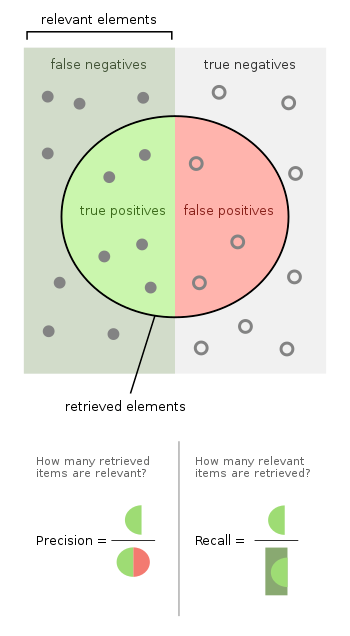

F1 score is defined as the harmonic mean between precision and recall. It is used as a statistical measure to rate performance. In other words, an F1-score (from 0 to 9, 0 being lowest and 9 being the highest) is a mean of an individual's performance, based on two factors i.e. precision and recall

In [64]:
tn, fp, fn, tp =confusion_matrix(tablo_label_id_fril_tesdata, labelpred).ravel()

In [65]:
round(fp/6500,2)

0.01

In [66]:
round(fn/6500,2)

0.01



---



---



Prediction one by one

Prediction of test images one by one 



---



---



In [68]:
# def folabid(num):
#    return df.query(f'id=={num}')['label'].values[0]

In [67]:
labels= ["cat", "dog"]

In [68]:
len(testdata.filenames)

12500

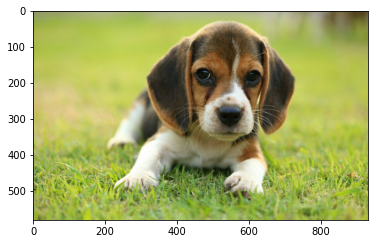

In [69]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1706.jpg"  )
# plt.title(folab(1706))
plt.imshow(image)

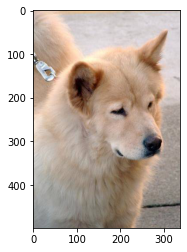

In [70]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1711.jpg"  )
# plt.title(folab(1704))
plt.imshow(image)

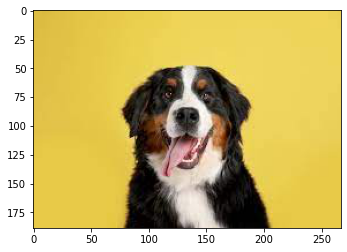

In [71]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1705.jpg"  )
# plt.title(folab(1705))
plt.imshow(image)

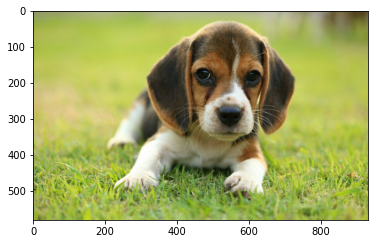

In [72]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1706.jpg"  )
# plt.title(folab(1706))
plt.imshow(image)

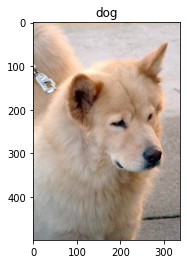

In [73]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1711.jpg"  )
plt.title(folab(1711))
plt.imshow(image)

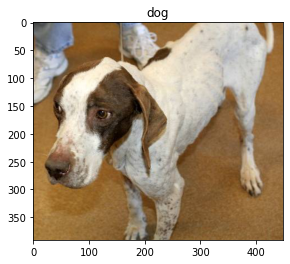

In [74]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1272.jpg"  )
plt.title(folab(1272))
plt.imshow(image)

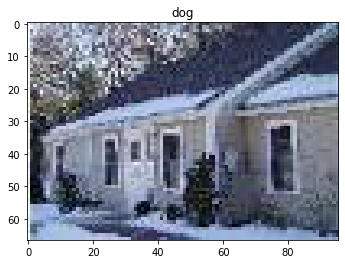

In [75]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/4748.jpg"  )
plt.title(folab(4748))
plt.imshow(image)

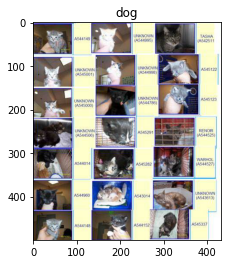

In [76]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/8055.jpg"  )
plt.title(folab(8055))
plt.imshow(image)

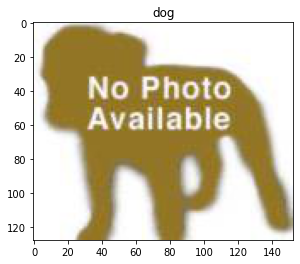

In [77]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/8084.jpg"  )
plt.title(folab(8084))
plt.imshow(image)

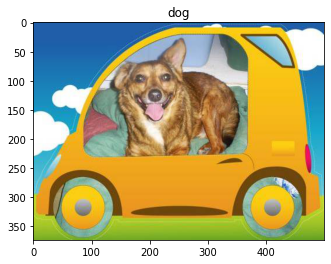

In [78]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/10479.jpg"  )
plt.title(folab(10479))
plt.imshow(image)

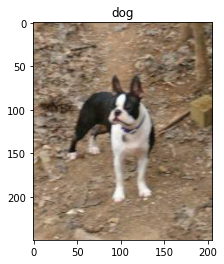

In [79]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/1105.jpg"  )
plt.title(folab(10479))
plt.imshow(image)

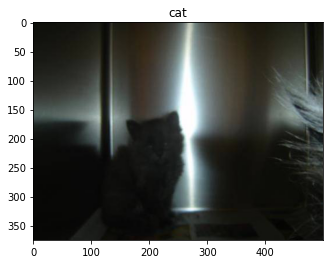

In [80]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/11875.jpg"  )
plt.title(folab(11875))
plt.imshow(image)

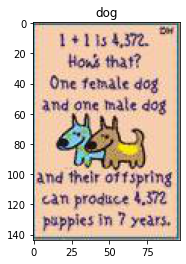

In [81]:
image = load_img( "/content/drive/My Drive/dogs-vs-cats/testdata/test/12274.jpg"  )
plt.title(folab(12274))
plt.imshow(image)

loop image by image , prediction and true label from csv file 

Diplay images when prediction is different from true label ( csv file )

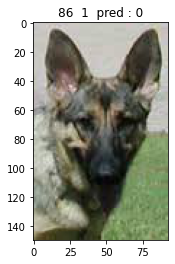

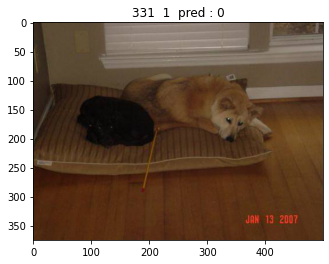

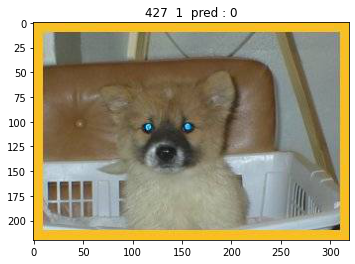

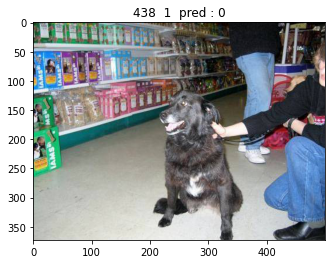

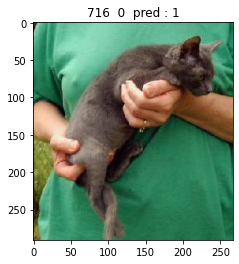

...

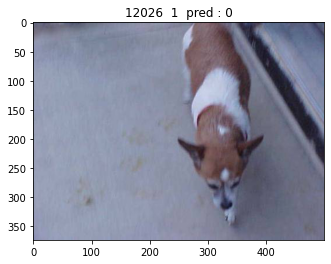

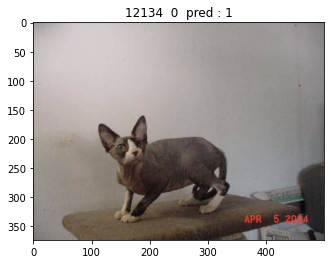

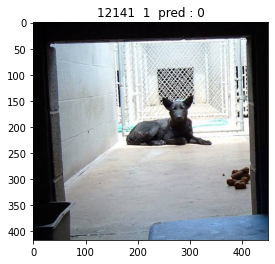

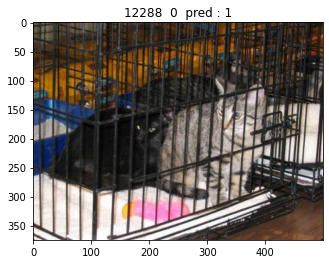

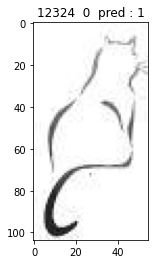

In [84]:
tablo_pred_label_one=[]
tablo_true_label_one=[]
numerreur=0
for im in range(1,12500):
  urlim="/content/drive/My Drive/dogs-vs-cats/testdata/test/"+str(im)+".jpg"
  image1 = load_img( urlim  )
  image = load_img(urlim, target_size=(224,224))
  image = np.expand_dims(image, axis=0)
  image = preprocess_input(image)
  prediction = model.predict(image,verbose=False)
  labelid = np.argmax(prediction, axis=1)[0]
  # print(labelid)
  tablo_pred_label_one.append(labelid)
  im1=folabid(im)
  # print(im1)
  tablo_true_label_one.append(im1)
  if labelid!=im1:
     plt.title(str(im) + "  " + str(im1) + "  pred : " + str(labelid))
     plt.imshow(image1)
     plt.show()
     numerreur+=1
 

In [85]:
len(tablo_pred_label_one)

12499

In [86]:
tablo_true_label_one

[1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,


In [87]:
numerreur

80

confusion matrix one by one

[[6197   42]
 [  38 6222]]


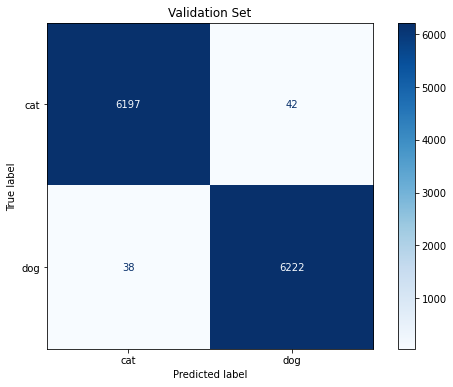

In [88]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm  = confusion_matrix(tablo_true_label_one, tablo_pred_label_one)
print(cm)
fig, ax = plt.subplots(figsize = (9, 6))
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ["cat", "dog"])
disp.plot(cmap = plt.cm.Blues, ax = ax)
ax.set_title("Validation Set")
plt.show()

In [89]:
from sklearn.metrics import classification_report
 
print(classification_report(tablo_true_label_one, tablo_pred_label_one))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      6239
           1       0.99      0.99      0.99      6260

    accuracy                           0.99     12499
   macro avg       0.99      0.99      0.99     12499
weighted avg       0.99      0.99      0.99     12499



In [90]:
tn, fp, fn, tp =confusion_matrix(tablo_true_label_one, tablo_pred_label_one).ravel()

In [99]:
print(tn, fp, fn, tp)

6197 42 38 6222


percentage of fp and fn

in csv file

In [93]:
df['label'].value_counts()

1    6260
0    6240
Name: label, dtype: int64

For cat

In [97]:
round(fp/(fp+tn),2)

0.01

for dog

In [98]:
round(fn/(fn+tp),2)

0.01